## Домашнее задание 3 (10 баллов)

## НИУ ВШЭ, 2023-24 учебный год

## О задании

В этом домашнем задании вы получите опыт подготовки данных и EDA (Exploratory Data Analysis), приблизившись к реальной работе с данными с помощью уже знакомых вам инструментов: numpy, pandas, matplotlib и seaborn, а также познакомитесь с plotly.

EDA - важный этап работы с данными. Именно в процессе EDA вы можете выяснить особенности датасета, найти зависимости в данных, протестировать гипотезы о взаимосвязях признаков и целевой переменной. В реальности вы сами будете определять, что и как проверять в рамках EDA, однако в данной работе гипотезы будут выдвинуты за вас автором задания. Также и типы графиков, которые вы будете использовать уже предопределены за вас. Выполняя задания по визуализациям, обращайте внимание на референсные картинки, которые были оставлены автором. Они показывают, какой примерно результат от вас ожидается.

Это задание будет включать в себя построение некоторого количества графиков, потому вот основные правила, в соответствии с которыми графики должны быть оформлены:
1. Любой график всегда имеет название.
2. Оси у графика подписаны (исключение - график делит название оси с соседним).
3. Подписи делаются на одном языке (либо английский, либо русский), но не на их смеси.
4. Если вы выводите несколько графиков, то они размещаются в рамках одного объекта matplotlib.pyplot.figure. Вы не выводите графики последовательно, а смотрите, как их разместить сразу все за раз.
5. Отдельные графики (если графиков на картинке больше 1) также имеют свои названия.
6. Если на графике есть несколько различных объектов, то для их различения используется легенда. Помещайте легенду в место, где она в наименьшей мере мешает восприятию самого графика.
7. Если есть легенда, то она должна иметь навание, а также ее содержание должно быть адекватными (пожалейте проверяющих, они не хотят разбирать, а к чему относится зеленая линия, которая на легенде помечена меткой "0").
8. Используйте цветовые гаммы, чтобы объекты на графиках отличались цветом.
9. Текст на визуализации должен быть читаем. Если вы вывели названия категорий в качестве подписей на оси Х, а эти названия наезжают друг на друга, то вам нужно что-то с этим сделать. Нечитаемый или плохо читаемый (очень маленький, невероятно огромный) текст ведет к снижению баллов.

*Тут правило про плагиат, которое вам итак известно - обнуляются все работы, которые подозреваются в некорректных заимствованиях!* Помните, что просто скопировать код из интернета и указать источник - это не ваша самостоятельная работа, а автора кода. Измените хоть что-нибудь в коде.

## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones). 

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано на [страничке датасета](https://archive.ics.uci.edu/dataset/240/human+activity+recognition+using+smartphones))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

Вероятно, сначала покажется сложным, но мы разберемся с некоторыми признаками в отдельности и вы сможете понять их смысл, уже исходя из фактических соотношений.

## Предобработка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
import os

kaggle_path = os.path.expanduser("~/.kaggle")
if not os.path.isdir(kaggle_path):
    os.mkdir(kaggle_path)
with open(os.path.join(kaggle_path, "kaggle.json"), mode="w") as f:
    f.write('{"username": "ivaand19", "key": "37aa0c063e9abadd1b2263c3c340a08d"}') #я ничего лучше не придумал, тем более, что этот акк мертв

In [3]:
! chmod 600 /root/.kaggle/kaggle.json
! kaggle datasets download uciml/human-activity-recognition-with-smartphones
! unzip human-activity-recognition-with-smartphones.zip

chmod: /root/.kaggle/kaggle.json: No such file or directory
zsh:1: command not found: kaggle
unzip:  cannot find or open human-activity-recognition-with-smartphones.zip, human-activity-recognition-with-smartphones.zip.zip or human-activity-recognition-with-smartphones.zip.ZIP.


In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [5]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Мы за вас сделали подвыборку признаков для удобства работы с ними.

In [6]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [7]:
train = train[cols_subset]
test = test[cols_subset]
train.head(220)

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING
3,-0.986542,-0.991241,0.986821,-0.938692,-0.999807,-0.848649,0.181935,-0.047663,-0.599118,1,STANDING
4,-0.992827,-0.992882,0.987434,-0.942469,-0.999806,-0.847865,0.185151,-0.043892,-0.676997,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...
215,-0.998032,-0.998242,-0.010948,-0.936085,-0.999899,0.278549,-0.577771,-0.351104,-0.520560,1,LAYING
216,-0.997024,-0.998612,-0.006818,-0.936065,-0.999886,0.278132,-0.578060,-0.350566,-0.637055,1,LAYING
217,-0.996556,-0.999073,-0.006361,-0.936065,-0.999862,0.277052,-0.578122,-0.349962,-0.641798,1,LAYING
218,-0.997812,-0.998538,-0.005144,-0.939306,-0.999889,0.276726,-0.578179,-0.349737,-0.365011,1,LAYING


### Задание 1 (0.5 балла)

Посмотрите на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишите, с чем это может быть связано? Если нет, то просто напишите, что пропусков и/или дублей нет.

In [8]:
if train.isnull().values.any():
    print(f' Есть {train.isnull().sum()} пропусков в train.')
else:
    print("Пропусков в train нет")

if train.duplicated().any():
    print(f' Есть {train.duplicated().sum()} дублей в train.')
else:
    print("Дублей в train нет")

Пропусков в train нет
Дублей в train нет


In [9]:
if test.isnull().values.any():
    print(f' Есть {test.isnull().sum()} пропусков в train.')
else:
    print("Пропусков в test нет")

if test.duplicated().any():
    print(f' Есть {test.duplicated().sum()} дублей в train.')
else:
    print("Дублей в test нет")

Пропусков в test нет
Дублей в test нет


### Задание 2 (0.5 балла)

Выведите основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Посмотрите на таблицу и напишите, видите ли вы в ней что-нибудь интересное.

In [10]:
train.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,-0.543884,-0.727735,0.678505,-0.468604,-0.847963,-0.489547,0.058593,-0.056515,-0.128562,17.413085
std,0.477653,0.315832,0.508656,0.544547,0.233633,0.511807,0.297480,0.279122,0.403686,8.975143
min,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.931208,1.000000
25%,-0.983282,-0.991595,0.804270,-0.936219,-0.999480,-0.812065,-0.017885,-0.143414,-0.486841,8.000000
50%,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000
75%,-0.106892,-0.474625,0.965095,-0.017129,-0.764508,-0.509079,0.248353,0.107659,0.155112,26.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.478157,1.000000,1.000000,30.000000


In [11]:
test.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000
mean,-0.559043,-0.735661,0.696878,-0.462063,-0.880361,-0.513923,0.074886,-0.048720,-0.154042,12.986427
std,0.439539,0.282074,0.502873,0.523916,0.160496,0.509205,0.324300,0.241467,0.392203,6.950984
min,-0.998936,-1.000000,-0.756774,-0.952357,-0.999989,-0.984195,-0.913704,-0.949228,-1.000000,2.000000
25%,-0.978433,-0.989078,0.836787,-0.934447,-0.999330,-0.829722,0.022140,-0.098485,-0.497070,9.000000
50%,-0.861830,-0.914698,0.934930,-0.852659,-0.979336,-0.729648,0.181563,-0.010671,-0.202050,12.000000
75%,-0.149596,-0.486423,0.970871,-0.009965,-0.799113,-0.545939,0.260252,0.092373,0.140254,18.000000
max,0.479547,0.117606,0.996148,0.786436,0.048730,0.833180,1.000000,0.973113,0.960367,24.000000


По данным можно сделать разные выводы, вот что заметил я:

- В train представлены максимально разные данные(почти по всем показателям есть значения -1 и 1, в то время как в test - не всегда есть крайние значения. С другой стороны, эти данные могут быть "выбросами" (странно, когда в train максимальное значение 'fBodyAcc-bandsEnergy()-1,8.2' равно 1, а в test 0.048730).

- При этом среднее, стандартное отклонение и перцентили по обоим датасетам очень схожи, так что они репрезентативны (потенциально не будет проблемы, что обучать будут на одних данных, а в тесте окажутся совсем другие)

### Задание 3 (0.5 балла)

Данные сбалансированы? У вас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Выведите количество наблюдений для всех категорий активности в train и test. Посчитайте разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы. Напишите, сбалансированы ли данные в train и test.

In [12]:
train_activity_counts = train['Activity'].value_counts()
max_train_activity = train_activity_counts.max()
min_train_activity = train_activity_counts.min()
train_difference_percentage = ((max_train_activity - min_train_activity) / max_train_activity) * 100
print(train_difference_percentage)
if train_difference_percentage <= 30:
    print('Данные в train сбалансированы.')
else:
    print('Данные в train несбалансированы.')

29.92181947405828
Данные в train сбалансированы.


##### Как же близко к 30%!

In [13]:
test_activity_counts = test['Activity'].value_counts()
max_test_activity = test_activity_counts.max()
min_test_activity = test_activity_counts.min()
test_difference_percentage = ((max_test_activity - min_test_activity) / max_test_activity) * 100
print(test_difference_percentage)
if test_difference_percentage <= 30:
    print('Данные в test сбалансированы.')
else:
    print('Данные в test несбалансированы.')

21.787709497206702
Данные в test сбалансированы.


### Задание 4 (0.5 балла)

Посчитайте корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

##### Как я понял, тут нужен one-hot encoding

In [14]:
encoded_train = pd.get_dummies(train, columns=['Activity'])
encoded_train.corr()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity_LAYING,Activity_SITTING,Activity_STANDING,Activity_WALKING,Activity_WALKING_DOWNSTAIRS,Activity_WALKING_UPSTAIRS
tBodyAccMag-mean(),1.000000,0.899080,0.369962,0.959827,0.697832,-0.370849,0.495561,0.426283,0.379796,-0.073652,-0.396643,-0.396389,-0.414460,0.358825,0.561344,0.405434
tBodyGyroJerk-mad()-X,0.899080,1.000000,0.380118,0.879900,0.507939,-0.382246,0.478567,0.380967,0.266002,-0.110321,-0.386730,-0.379403,-0.370699,0.531695,0.445048,0.257524
tGravityAcc-min()-X,0.369962,0.380118,1.000000,0.380404,0.239088,-0.988663,0.797116,0.667415,-0.261676,-0.042371,-0.973167,0.187055,0.262354,0.234820,0.192409,0.159741
tBodyAcc-max()-X,0.959827,0.879900,0.380404,1.000000,0.613383,-0.384192,0.480229,0.405023,0.335708,-0.055633,-0.394745,-0.387297,-0.399861,0.298526,0.658369,0.347429
"fBodyAcc-bandsEnergy()-1,8.2",0.697832,0.507939,0.239088,0.613383,1.000000,-0.213318,0.363170,0.423927,0.260316,-0.037000,-0.287395,-0.276766,-0.296141,0.189834,0.217399,0.534750
"angle(X,gravityMean)",-0.370849,-0.382246,-0.988663,-0.384192,-0.213318,1.000000,-0.783848,-0.643655,0.265523,0.026137,0.956927,-0.181082,-0.266279,-0.233903,-0.222029,-0.116118
"angle(Y,gravityMean)",0.495561,0.478567,0.797116,0.480229,0.363170,-0.783848,1.000000,0.594885,-0.046213,-0.009829,-0.816776,-0.096667,0.241314,0.243434,0.186124,0.310982
"angle(Z,gravityMean)",0.426283,0.380967,0.667415,0.405023,0.423927,-0.643655,0.594885,1.000000,-0.183815,-0.098712,-0.678385,-0.065389,0.167701,0.198901,0.162849,0.273889
fBodyAcc-skewness()-X,0.379796,0.266002,-0.261676,0.335708,0.260316,0.265523,-0.046213,-0.183815,1.000000,0.019742,0.206542,-0.223813,-0.419856,0.024511,0.176759,0.277785
subject,-0.073652,-0.110321,-0.042371,-0.055633,-0.037000,0.026137,-0.009829,-0.098712,0.019742,1.000000,0.028078,0.029473,0.018212,-0.047385,-0.014201,-0.019371


In [15]:
encoded_test = pd.get_dummies(test, columns=['Activity'])
encoded_test.corr()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity_LAYING,Activity_SITTING,Activity_STANDING,Activity_WALKING,Activity_WALKING_DOWNSTAIRS,Activity_WALKING_UPSTAIRS
tBodyAccMag-mean(),1.000000,0.934773,0.407084,0.965114,0.767875,-0.400871,0.439051,0.425011,0.365670,-0.057359,-0.432375,-0.401367,-0.414812,0.382256,0.533885,0.399410
tBodyGyroJerk-mad()-X,0.934773,1.000000,0.393773,0.898628,0.625414,-0.387274,0.423288,0.368411,0.278765,-0.079811,-0.409460,-0.395664,-0.379256,0.522026,0.464393,0.255742
tGravityAcc-min()-X,0.407084,0.393773,1.000000,0.386764,0.301643,-0.989043,0.697006,0.633881,-0.237864,0.004927,-0.983505,0.196159,0.244371,0.227835,0.193024,0.163337
tBodyAcc-max()-X,0.965114,0.898628,0.386764,1.000000,0.707129,-0.384454,0.410477,0.398008,0.338543,-0.071786,-0.407889,-0.396788,-0.408003,0.281951,0.638335,0.364582
"fBodyAcc-bandsEnergy()-1,8.2",0.767875,0.625414,0.301643,0.707129,1.000000,-0.279783,0.327473,0.446245,0.293881,-0.090817,-0.342430,-0.295023,-0.323854,0.213190,0.270809,0.524637
"angle(X,gravityMean)",-0.400871,-0.387274,-0.989043,-0.384454,-0.279783,1.000000,-0.668108,-0.615114,0.235208,0.003138,0.966505,-0.203741,-0.240721,-0.229489,-0.218656,-0.115408
"angle(Y,gravityMean)",0.439051,0.423288,0.697006,0.410477,0.327473,-0.668108,1.000000,0.425454,-0.087006,-0.047553,-0.725073,-0.058690,0.200925,0.193011,0.160255,0.262663
"angle(Z,gravityMean)",0.425011,0.368411,0.633881,0.398008,0.446245,-0.615114,0.425454,1.000000,-0.208121,0.055885,-0.649058,-0.043474,0.109366,0.166195,0.164282,0.286753
fBodyAcc-skewness()-X,0.365670,0.278765,-0.237864,0.338543,0.293881,0.235208,-0.087006,-0.208121,1.000000,0.015103,0.224384,-0.274466,-0.411989,0.034471,0.237610,0.213281
subject,-0.057359,-0.079811,0.004927,-0.071786,-0.090817,0.003138,-0.047553,0.055885,0.015103,1.000000,0.019262,0.017383,0.021736,-0.042317,-0.006886,-0.011007


Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

### Задание 5 (0.5 балла)

Вы проверили основную информацию о данных и составили свое первое впечатление о них. Теперь визуализации.

Начнем рисовать графики с небольшой разминки. Выберите две любые математические функции (отличные от линейной) и нарисуйте их на одном графике. Подпишите каждый из графиков, чтобы было понятно, какие функции вы выбрали. Ниже будет пример.

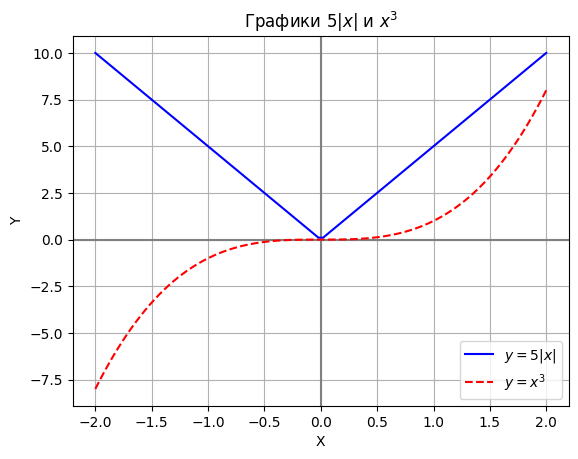

In [16]:
x = np.linspace(-2, 2, 100)
y1 = 5 * np.abs(x)
y2 = x ** 3

plt.axhline(0, color='grey', linewidth=1.5, linestyle='-')
plt.axvline(0, color='grey', linewidth=1.5, linestyle='-')
plt.plot(x, y1, label='$y = 5|x|$', color='blue')
plt.plot(x, y2, label='$y = x^3$', color='red', linestyle='--')
plt.title('Графики $5|x|$ и $x^3$')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid(True)
plt.show()

### Задание 6 (0.5 балла)

Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируйте количество сэмплов в каждой из категорий отдельно для train и test сетов, как в примере ниже. Проследите, чтобы порядок категорий слева и справа был одинаков. Иначе не очень удобно их сравнивать (когда они в разных местах двух графиков). Также заметьте, что в примере ось Х в одинаковом масштабе, что тоже удобно для сравнения.

Вам может пригодиться:
- plt.barh или ax.barh

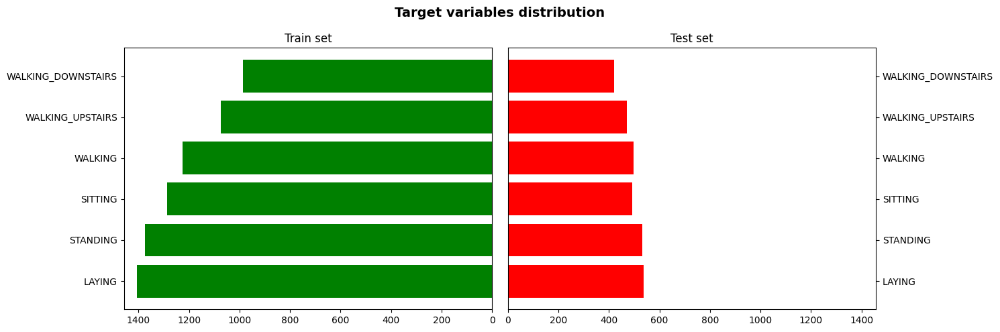

In [17]:
import matplotlib.pyplot as plt

categories_train = train['Activity'].value_counts().index
counts_train = train['Activity'].value_counts().values

categories_test = test['Activity'].value_counts().index
counts_test = test['Activity'].value_counts().values

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), sharey=True)
plt.suptitle('Target variables distribution', fontsize=14, fontweight='bold')

axes[0].barh(categories_train, counts_train, color='green')
axes[0].set_title('Train set')

axes[1].barh(categories_test, counts_test, color='red')
axes[1].set_title('Test set')

axes[0].get_xticklabels()
axes[1].get_xticklabels()
axes[0].set_xlim(0, max(max(train_activity_counts), max(test_activity_counts)) + 50)
axes[1].set_xlim(0, max(max(train_activity_counts), max(test_activity_counts)) + 50)

axes[0].yaxis.tick_left()
axes[1].yaxis.tick_right()
axes[0].invert_xaxis()
axes[1].yaxis.set_label_position("right")
axes[1].yaxis.set_ticks_position("right")

max_count_train = max(counts_train)
max_count_test = max(counts_test)

plt.tight_layout()
plt.show()

Правда на таких графиках проще проверять баланс классов таргета?)

И не поспоришь;)

### Задание 7 (0.5 балла)

Ранее вы выводили таблицу корреляций. Однако просто таблица корреляций не очень удобна для анализа. Что, если признаков было бы больше? Визуализируйте heatmap корреляций. Подпишите значения корреляций, округленные до 2 знаков после запятой, на графике и оставьте только те значения, которые по модулю не меньше 0.5. Будем считать такие корреляции существенными. Если будете брать код из семинарского ноутбука, то поменяйте в нем что-нибудь, например, цветовую гамму, иначе проверяющий будет карать :)

Какой признак стоит исключить из рассмотрения корреляций? Напишите его название, а также причину, почему нет смысла его рассматривать. 

Вам может пригодиться:
- sns.heatmap
- методы get_text и set_text у атрибута texts графика

### Уберем признак subject, потому что рассматривать корреляцию между чем-то и номер человека бесполезно

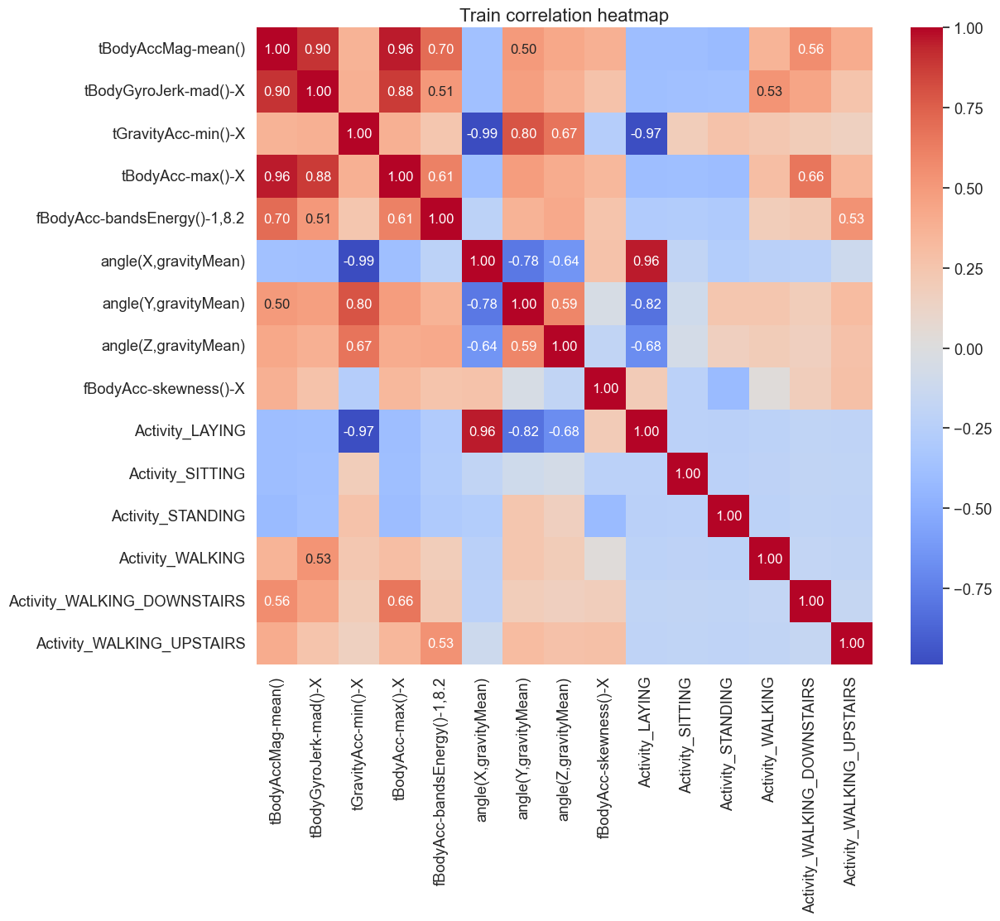

In [18]:
correlation_train = encoded_train.corr()
sns.set(font_scale=1.2)

correlation_train = correlation_train.drop('subject', axis=1)
correlation_train = correlation_train.drop('subject', axis=0)

plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(correlation_train, annot=True, cmap='coolwarm', annot_kws={"size": 12})

# Отображение только существенных корреляций (по модулю не меньше 0.5)
for text in heatmap.texts:
    value = float(text.get_text())
    if np.abs(value) < 0.5:
        text.set_text('')
        text.set_visible(False)
    else:
        text.set_text('{:.2f}'.format(value))

plt.title('Train correlation heatmap', fontsize=16)
plt.show()


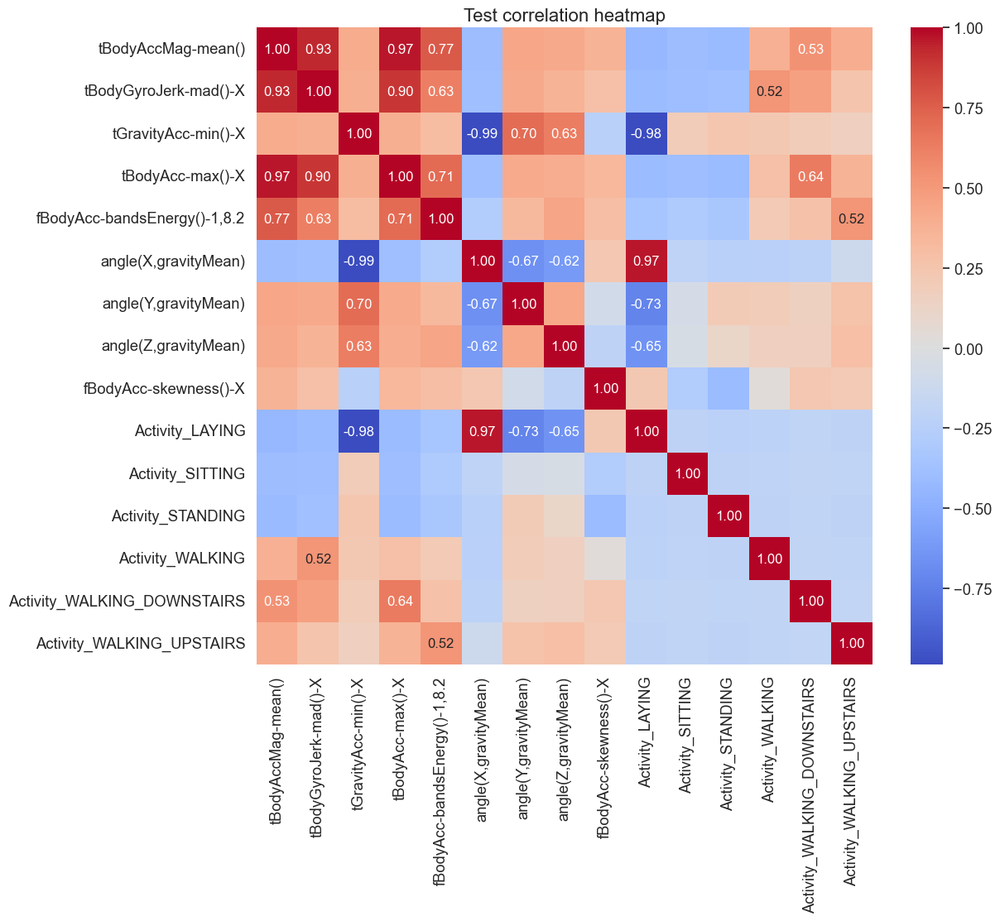

In [19]:
correlation_test = encoded_test.corr()
sns.set(font_scale=1.2)

correlation_test = correlation_test.drop('subject', axis=1)
correlation_test = correlation_test.drop('subject', axis=0)

plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(correlation_test, annot=True, cmap='coolwarm', annot_kws={"size": 12})

# Отображение только существенных корреляций (по модулю не меньше 0.5)
for text in heatmap.texts:
    value = float(text.get_text())
    if np.abs(value) < 0.5:
        text.set_text('')
        text.set_visible(False)
    else:
        text.set_text('{:.2f}'.format(value))

plt.title('Test correlation heatmap', fontsize=16)
plt.show()


### Задание 8 (0.5 балла)

Для начала будем стрелять из пушки по воробьям. Выведите pairplot по всем данным train сета. Напишите, заметили ли вы в нем что-нибудь интересное, чего не было в таблицах и графиках ранее, а также сообщите, было ли вам удобно анализировать 100 графиков. 

### Выводить encoded_train нет смысла, тем более и так pairplot перегружен.

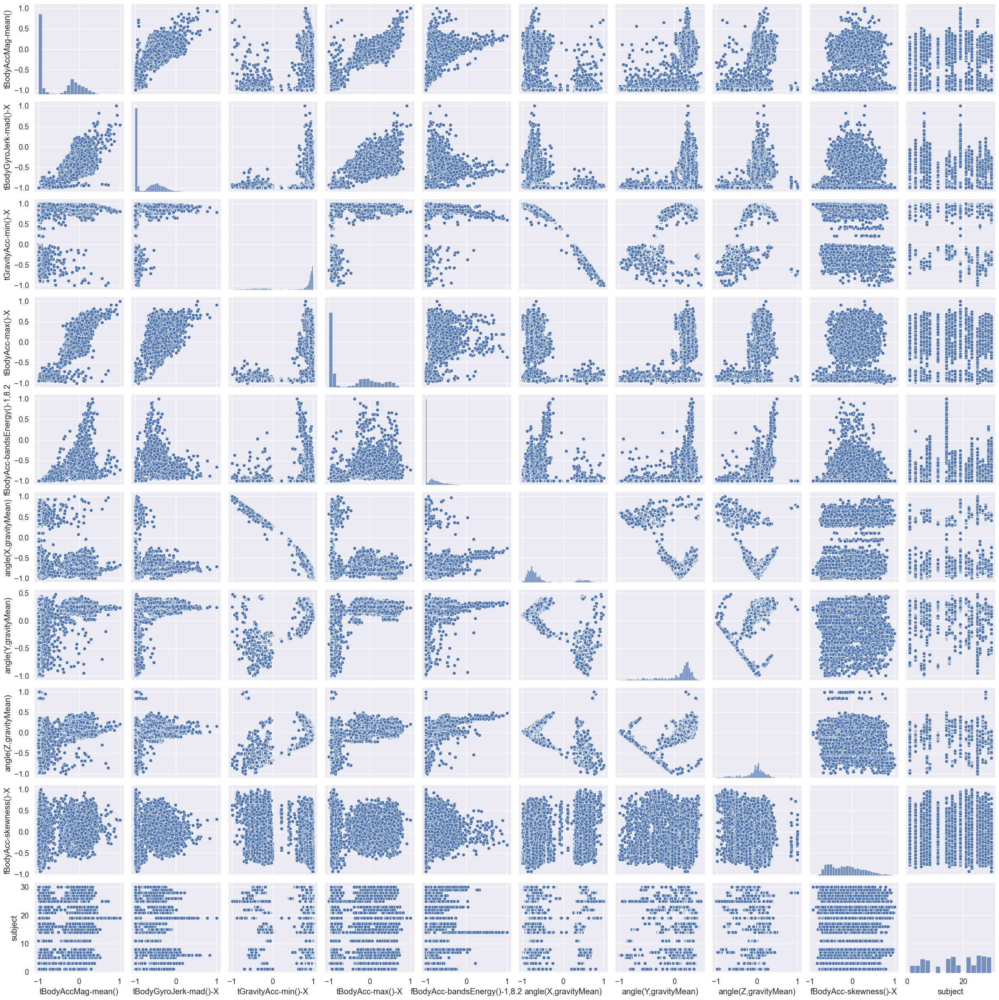

In [20]:
sns.pairplot(train)
plt.show()

1) анализировать 100 графиков - ужасная затея. Ничего не видно, и мозг ломается

2) иногда где-то связь нелинейная, но она есть, в то время как корреляция не показывает наличие сильной связи (например, 'angle(Y,gravityMean)' и 'fBodyAcc-bandsEnergy()-1,8.2'.). Но где-то и правда нет никакой связи.

3) Также теперь мы увидели распределение всех величин, а до этого их не знали.

### Задание 9 (1 балл)

Окей. Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразите плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей, как в примере ниже. Видите закономерность? Можно ли поделить все активности на две группы? Если да, то проведите вертикальную линию, которая визуально неплохо разделяет эти группы. 

Давайте первую группу называть статическими активностями, а вторую - динамическими.

Посчитайте, какую долю правильных ответов дает ваша вертикальная линия для разделения именно этих двух групп. С чем может быть связан полученный вами результат? Предположите логическое обоснование (почему именно данный признак так хорошо/плохо разделяет группы активностей).

Вам может пригодиться:
- sns.kdeplot

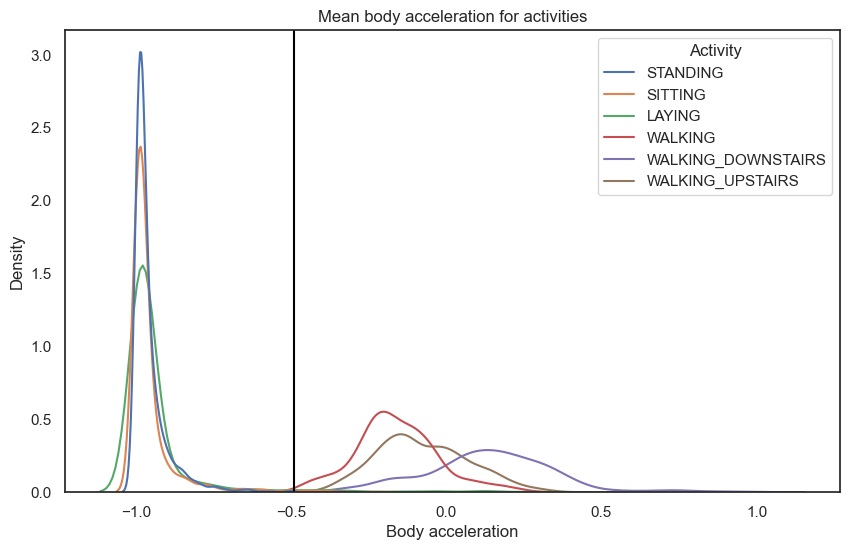

Доля правильных ответов: 99.252%


In [21]:
dataset = train[['tBodyAccMag-mean()', 'Activity']]
sns.set(style="white")
plt.figure(figsize=(10, 6))
sns.kdeplot(data=train, x='tBodyAccMag-mean()', hue='Activity')

separator = -0.49
plt.axvline(separator, color='black')

plt.title('Mean body acceleration for activities')
plt.xlabel('Body acceleration')
plt.ylabel('Density')
plt.show()

static_activities = dataset[dataset['tBodyAccMag-mean()'] <= separator]['Activity']
dynamic_activities = dataset[dataset['tBodyAccMag-mean()'] > separator]['Activity']
correct_static = (static_activities == 'STANDING').sum() + (static_activities == 'SITTING').sum() + (static_activities == 'LAYING').sum()
correct_dynamic = (dynamic_activities == 'WALKING').sum() + (dynamic_activities == 'WALKING_DOWNSTAIRS').sum() + (dynamic_activities == 'WALKING_UPSTAIRS').sum()

accuracy = (correct_static + correct_dynamic) / len(dataset)
print(f'Доля правильных ответов: {accuracy:.3%}')

Значение separator искал подбором, при нем доля наибольшая, это еще пригодится для задания 16.

##### Именно этот признак хорошо разделяет 2 вида активностей (статические и динамические), потому что в статике никакого ускорения нет/оно минимально, а в движении оно есть и точно больше, чем в статике.

### Задание 10 (0.5 балла)

Поздравляем, вы проверили первую гипотезу в процессе EDA. Однако нам бы хотелось уметь не группы разделять, а каждый отдельный вид активности. Попробуйте нарисовать "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train. Можно ли сделать какой-то вывод по полученной визуализации? Проанализируйте и проинтерпретируйте полученные картинки (если заметили какую-то особенность, может какая-то категория значительно выделяется, то предположите, почему так могло произойти).

Вам может пригодиться:
- sns.boxplot

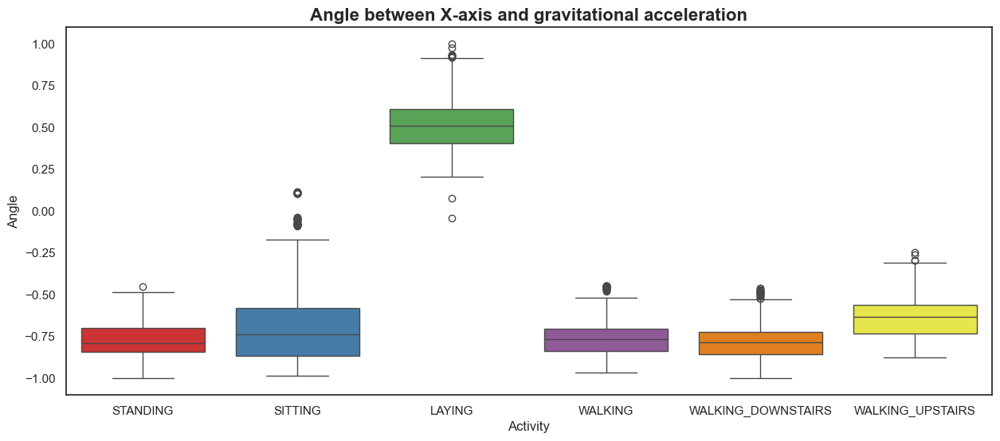

In [22]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='Activity', y='angle(X,gravityMean)', data=train, palette='Set1')
plt.title('Angle between X-axis and gravitational acceleration', fontsize=16, fontweight='bold')
plt.xlabel('Activity')
plt.ylabel('Angle')
plt.show()

Заметим, что для 'LAYING' данные сильно отличаются от остальных активностей, и по данному показателю этот вид активности можно отделить от остальных. 

Объяснить это можно тем, что лежачее положение кардинально отличается от остальных, так как в нем тело находится в горизонтальном положении, а в любом другом случае - в вертикальном положении. Поэтому так сильно отличается данный показатель.

### Задание 11 (0.5 балла)

Посмотрим теперь на `tBodyAcc-max()-X`. Визуализируйте скрипичные диаграммы для этого признака с разделением по активностям на всем train. Кажется логичным, что максимальное ускорение в моменте для разных активностей будет различаться. Однако есть ли активность, которая будет выделяться? Если да, то предложите объяснение, почему эта активность выделяется.

Вам может пригодиться:
- sns.violinplot

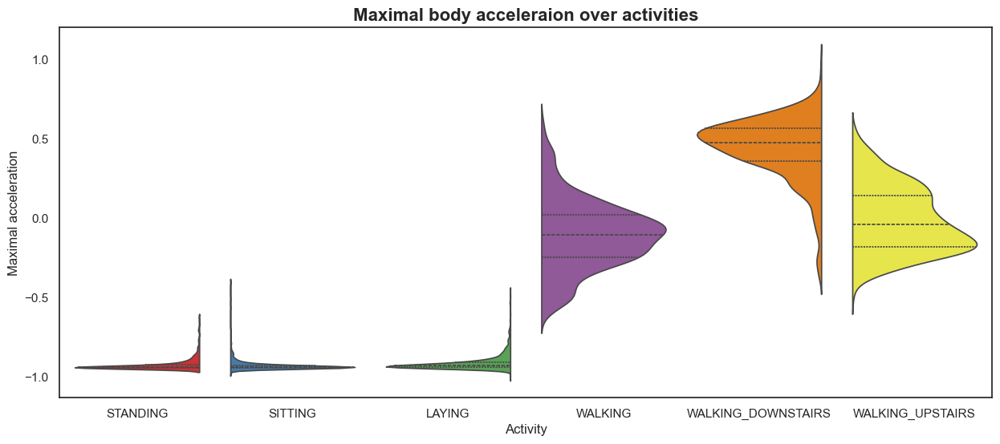

In [23]:
plt.figure(figsize=(15, 6))

sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=train, inner="quart", 
               scale='width', palette='Set1', split=True)
plt.title('Maximal body acceleraion over activities', fontsize=16, fontweight='bold')
plt.xlabel('Activity')
plt.ylabel('Maximal acceleration')
plt.show()

Статические активности внутри себя очень похожи, а среди динамических "WALKING_DOWNSTAIRS" отличается от остальных. Это объясняется тем, что при движении вниз человек движется быстрее, и при этом ускоряется по мере движения вниз. И это ускорение отличается от обычное ходьбы сильнее, чем ходьба от движении вверх.

Поэтому по данному признаку можно отделить "WALKING_DOWNSTAIRS" от остальных активностей.

***P.S. Чтобы график выглядел как надо, надо либо в коллабе запускать, либо обновить библиотеку.***

### Задание 12 (1 балл)

Вы уже можете с довольно хорошим качеством выделить две категории активности из шести. Продолжим. 

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажите распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (boxenplot - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже). Можно ли выделить еще какие-то активности? Если да, напишите, какие активности на 1 и 2 графиках выделяются.

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec (заметили, что один график больше другого? попробуйте сами так сделать - вам понравится...)
- sns.boxenplot
- sns.histplot

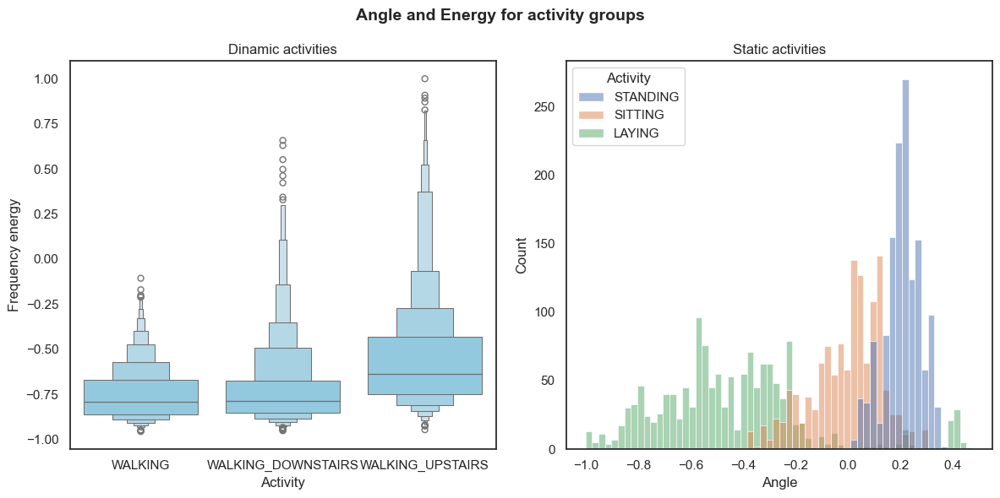

In [24]:
static_activities = ['SITTING', 'STANDING', 'LAYING']
dynamic_activities = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS']
static_data = train[train['Activity'].isin(static_activities)]
dynamic_data = train[train['Activity'].isin(dynamic_activities)]
sns.set(style="white")
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plt.suptitle('Angle and Energy for activity groups', fontsize=14, fontweight='bold')
sns.boxenplot(x='Activity', y='fBodyAcc-bandsEnergy()-1,8.2', data=dynamic_data, ax=axes[0], color='skyblue')
axes[0].set_title('Dinamic activities')
axes[0].set_ylabel('Frequency energy')
axes[0].grid(False)
sns.histplot(x='angle(Y,gravityMean)', data=static_data, bins=60, hue='Activity', ax=axes[1])
axes[1].set_title('Static activities')
axes[1].set_xlabel('Angle')
axes[1].grid(False)
plt.tight_layout()
plt.show()

По первому графику можно заметить, что по энергии ускорения тела "WALKING_UPSTAIRS" отличается от других динамических активностей. Это объясняется тем, что при движении вверх человек тратит сильно больше энергии, чем при остальных видах ходьбы.

А по второму графику заметим, что по признаку 'angle(Y,gravityMean)' активность "STANDING" сильно отличается от остальных статичных активностей. Обосновать это можно тем, что именно стоя человек больше всего расположен по оси y. Это же подтверждается тем, что положение сидя ближе к стоячему по этому признаку, чем к лежачему.

### Задание 13 (0.5 балла)

Не всегда жизнь будет такой легкой, а данные будут полностью или почти линейно разделимы в одному признаку (иначе чем бы занимались дата саентисты...). Часто данные вообще ни по одному признаку нельзя адекватно разделить (да и по комбинациям признаков тоже). Давайте попробуем взять не один признак, а целых два! 

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`, и теперь вывести боксплот распределения `angle(Y,gravityMean)` по разным активностям? Попробуйте и напишите, выделилась ли какая-то категория? 

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.boxplot

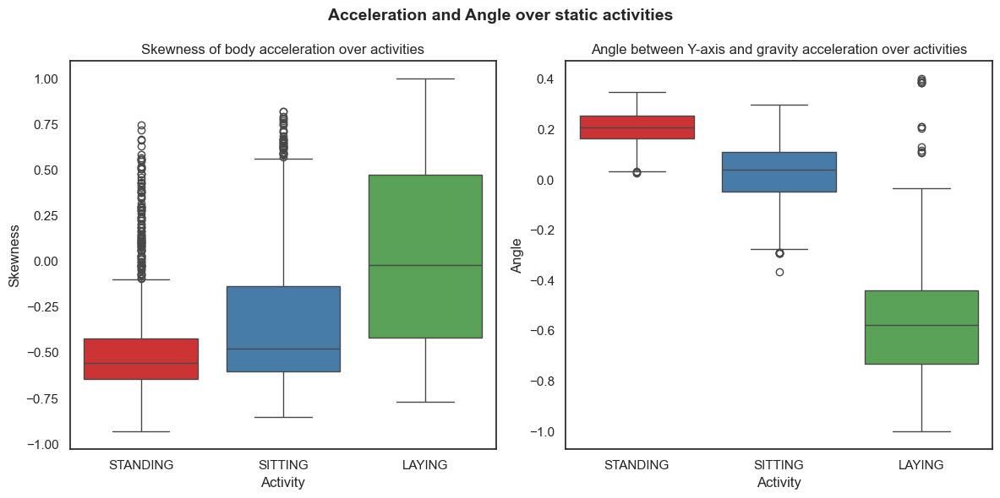

In [25]:
sns.set(style="white")
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
plt.suptitle('Acceleration and Angle over static activities', fontsize=14, fontweight='bold')

sns.boxplot(x='Activity', y='fBodyAcc-skewness()-X', data=static_data, ax=axes[0], palette='Set1')
axes[0].set_title('Skewness of body acceleration over activities')
axes[0].set_ylabel('Skewness')
axes[0].grid(False)
skewness_threshold = -0.376
filtered_static_data = static_data[static_data['fBodyAcc-skewness()-X'] < skewness_threshold]
sns.boxplot(x='Activity', y='angle(Y,gravityMean)', data=filtered_static_data, ax=axes[1], palette='Set1')
axes[1].set_title('Angle between Y-axis and gravity acceleration over activities')
axes[1].set_ylabel('Angle')
axes[1].grid(False)
plt.tight_layout()
plt.show()

По первому графику сложно что-то явно выделить, так как слишком много пересечений.

А по второму можно выделить каждую из статических активностей, но стоя и лежа мы уже выделяли, поэтому выделим "SITTING".

Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 (1 балл)

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных. Да, можно было бы сказать, что, раз уж мы выделили 5 из 6 категорий, то все остальное - это и есть последняя категория, но мы не идем легкими путями. Выделить оставшуюсь категорию с хорошим качеством не так уж и просто. Из доступных признаков, сначала посмотрите на распределение `tBodyAcc-max()-X` на динамических активностях (скрипичная диаграмма отлично подойдет). 

А теперь спускаем вам порог `tBodyAcc-max()-X < 0.157`. Для таких строк постройте диаграмму рассеяния для признака `tGravityAcc-min()-X`. Да, получается неидеально, но это честная работа. Можно выбрать порог так, чтобы чисто из таблицы с динамическими активностями из строк, где `tBodyAcc-max()-X < 0.157`, выбрать по некоторому порогу для `tGravityAcc-min()-X` строки так, чтобы доля правильных ответов на оставшейся категории была не меньше 83%!

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.violinplot
- sns.swarmplot (иногда лучше подходит, чем просто sns.scatterplot)

Обратите внимание, что подписи к осям можно убирать методами plt. Например, если у вас общее название для оси Y для обоих графиков, то можно не подписывать ось Y у второго графика.

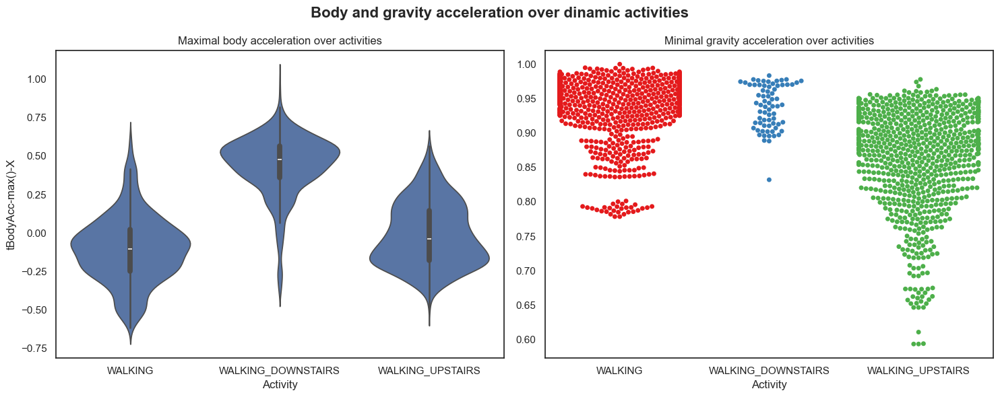

In [26]:
sns.set(style="white")
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
plt.suptitle('Body and gravity acceleration over dinamic activities', fontsize=16, fontweight='bold')
sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=dynamic_data, ax=axes[0], scale='width')
axes[0].set_title('Maximal body acceleration over activities')
axes[0].grid(False)
threshold = 0.157
filtered_dynamic_data = dynamic_data[dynamic_data['tBodyAcc-max()-X'] < threshold]
sns.swarmplot(x='Activity', y='tGravityAcc-min()-X', data=filtered_dynamic_data, palette='Set1')
plt.title('Minimal gravity acceleration over activities')
axes[1].set_ylabel('')
axes[1].grid(False)
plt.tight_layout()
plt.show()

Либо я чего-то не понял, либо нам осталось выделить "WALKING", но по этим признакам его никак не выделить...

### Задание 15 (0.5 балла)

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`). Синтаксис очень похож на `seaborn`, но вот [документация для plotly.express](https://plotly.com/python-api-reference/plotly.express.html). 

Сначала подготовим данные для визуализации. Будем считать t-SNE просто "черным ящиком", который принимает наши данные и проецирует их в двумерное или трехмерное пространство. Возможно, придется немного подождать.

In [27]:
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [28]:
!pip install plotly
import plotly.express as px

In [29]:
fig = px.scatter(df_2_comp, x='x', y='y', color='Activity', title='t-SNE 2D Projection of Activities')
fig.show()

Мы не отстаем от трендов и тоже можем в 3D. Сейчас и вы научитесь (если еще не умеете). Нарисуйте scatter_3d-график через `plotly.express` для `df_3_comp` с выделением цветами активностей. Повращайте его. Нормально получилось? Есть ли какая-то структура у точек?

In [30]:
fig = px.scatter_3d(df_3_comp, x='x', y='y', z='z', color='Activity', title='t-SNE 3D Projection of Activities')
fig.show()

На обоих графиках можно выделить лежачую активность, положение сидя и стоя расположены вместе, но перемешаны. И по отдельности от них все динамические активности, но и они все перемешаны между собой.

### Задание 16 (1 балл)

Мы сделали вам fit. Ваша очередь сделать predict. Допишите функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект. Рекомендуем сразу записывать из строками, а не кодировать в числа. Дальше фукнция `accuracy_score` выдаст вам долю правильных ответов.

Подсказка: вы уже отделили категории друг от друга по каким-то признакам. Воспользуйтесь этим знанием! Используя только проведенный вами анализ можно спокойно выбить не менее 75% на train и test! Если вы получите меньше 75%, то балл будет снижен. Авторское решение (на основе всех графиков выше) выбивает 81% и 77% на train и test соответственно. [Шапргалка с готовыми идеями для такой задачи](https://www.youtube.com/watch?v=dQw4w9WgXcQ)

In [31]:
def predict(df: pd.DataFrame):
    predictions = []
    for index, row in df.iterrows():
        if row['tBodyAccMag-mean()'] <= -0.49: #отделяем статические активности
            if row['angle(X,gravityMean)'] > 0: #по углу X выделяем положение лежа
                predictions.append('LAYING')
            elif row['angle(Y,gravityMean)'] > 0.14: #по углу Y выделяем положение стоя
                predictions.append('STANDING')
            else: # по остаточному принципу - находим сидя
                predictions.append('SITTING')
        else: #отделяем динамические активности
            if row['angle(X,gravityMean)'] > -0.6: #движение вверх выделим не по энергии, как мы описывали до этого, а по углу X
                predictions.append('WALKING_UPSTAIRS')
            elif row['tBodyAcc-max()-X'] > 0.2: #движение вниз выделим по максимальному ускорению
                predictions.append('WALKING_DOWNSTAIRS')
            else: #по остаточному принципу выделяем обычную ходьбу
                predictions.append('WALKING')
    return predictions

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [32]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.8142002176278563
Accuracy on test set => 0.7824906684764167


__Место для мема и/или фидбэка__

##### Когда дали датасет с каким-то страшными и непонятными параметрами, а их еще надо интерпретировать:
<center>
<img src="https://www.meme-arsenal.com/memes/38730ec35d8c662c27a9f50a5ee6e8d0.jpg", height="300">
    
Но я, надеюсь, справился, мне очень помогло [вот это](https://www.youtube.com/watch?v=6iFbuIpe68k&t=156s).

### А домашка классная, мне оч понравилось;)